# End-to-end multi-class Dog Breed Classification

This notebook build an end-to-end multi-class image classifier using Tensorflow 2.0 and TensorFlow Hub.

## 1. Problem

Identifying the breed of a dog given an image of a dog. 
When I am sitting at the cafe and I take a photo of a dog, I want to know what breed of dog it is.


## 2. Data

The data we are using is from Kaggle's dog breed identification competition.
https://www.kaggle.com/c/dog-breed-identification/data

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image.

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

## 4. Features

Some information about the data:

* We're dealing with images ( unstructured data) so it's probably best to use deep learning/transfer learning.
* There are 120 breeds of dogs ( this means there are 120 different classes).
* There are around 10k+ images in the training set ( these images have labels).
* There are around 10k images in the test set ( these images have no labels, because we will want to predict them).


In [1]:
# Unzip the updated data into Google Drive
# !unzip "drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d "drive/MyDrive/Dog Vision/"


### Get our workspace ready

* Import TensorFlow 2.x
* Import TensorFlow Hub
* Make sure we are using a GPU

In [2]:
# Import necessary tools
import tensorflow as tf
import tensorflow_hub as hub
print("TF version: ", tf.__version__)
print("TF Hub version: ", hub.__version__)

# Check for GPU availability
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

TF version:  2.6.0
TF Hub version:  0.12.0
GPU available


In [3]:
# Import TF 2.x in case you have TF 1.x
# try:
#   # %tensorflow_version only exists in Colab
#   %tensorflow_version 2.x
# except Exception:
#   pass

## Getting our data ready ( turning into Tensors )

With all machine learning models, our data has to be in numerical format. So that's what we'll be doing first. Turning our images into Tensors ( numerical representations). 

Let's start by accessing our data and checking out the labels.

In [4]:
# Checkout the labels of our data

import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     b3f01d9493c18a2a4a41c7a4458970a3  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [5]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [6]:
# How many images are there of each breed?
labels_csv["breed"].value_counts()

scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
komondor                 67
golden_retriever         67
brabancon_griffon        67
eskimo_dog               66
briard                   66
Name: breed, Length: 120, dtype: int64

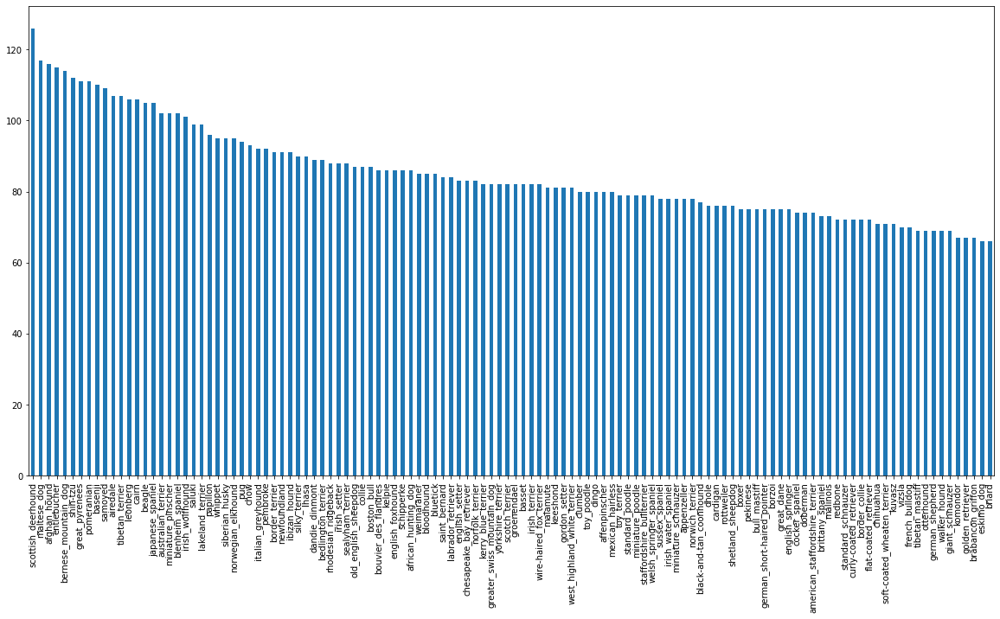

In [7]:
# Plot that
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10));

In [8]:
labels_csv["breed"].value_counts().mean()

85.18333333333334

In [9]:
labels_csv["breed"].value_counts().median()

82.0

# Google recommends to have a minimum of 10 images per class - Auto ML, it would be great to have 100 annotation per labels, so 100 images per class

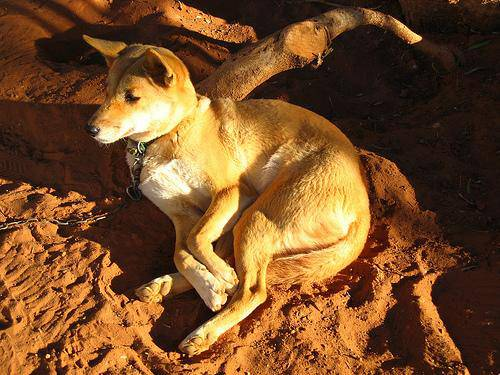

In [10]:
# Let's view an image
from IPython.display import Image
Image("drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg") # cmd + shift + space to open docs ( shift + tab in Jupyter)
 

### Getting images and their labels
Let's get a list of all of our image file pathnames.

In [11]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [12]:
# Create pathname from image ID's
filenames = ["drive/MyDrive/Dog Vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]

# Check the first 10
filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [13]:
# Check whether number of filenames matches number of actual image files
import os
if len(os.listdir("drive/MyDrive/Dog Vision/train/")) == len(filenames):
  print("Filenames match actual amount of files!!! Proceed.")
else:
  print("Filenames do not match the actual amount of files, check the target directory.")

Filenames match actual amount of files!!! Proceed.


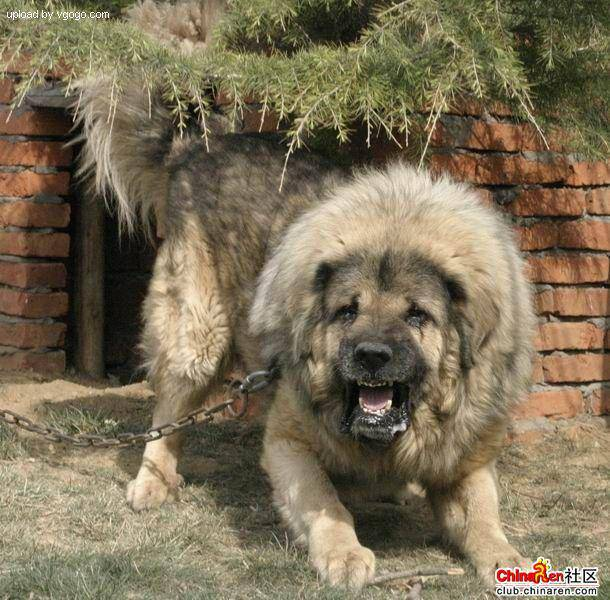

In [14]:
# One more check
Image(filenames[9000])

In [15]:
labels_csv["breed"][9000]

'tibetan_mastiff'

Since we've now got our training image filepaths in a list, let's prepare our labels.

In [16]:
import numpy as np
labels = labels_csv["breed"].to_numpy() # labels = np.array(labels) same thing
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [17]:
len(labels)

10222

In [18]:
# See if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames!")
else: 
  print ("Number of labels does not match the number of filenames, check data directories!")

Number of labels matches number of filenames!


In [19]:
# Find the unique label values
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [20]:
len(unique_breeds)

120

In [21]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [22]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:1]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False])]

In [23]:
len(boolean_labels)

10222

In [24]:
# Example: Turning boolean array into integers
print(labels[0]) #original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the samepl label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [25]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our own validation set
Since the dataset from Kaggle doesn't come with a validation set, we are going to create our own

In [26]:
# Setup X and y variables
X = filenames
y = boolean_labels

In [27]:
len(filenames), len(boolean_labels)

(10222, 10222)

We are going to start off experimenting with ~1000 samples and increase as needed.

In [28]:
# Set number of images to use for experimentingm, hyperparameters in CAPITALS
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}


In [29]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split


# np.random.seed(42)

# Split tehm into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES], 
                                                  y[:NUM_IMAGES], 
                                                  test_size=0.2,
                                                  random_state=42)
len(X_train), len(y_train), len(X_val), len(y_val) 


(800, 800, 200, 200)

In [30]:
# Let's have a look at the training data
X_train[:1], y_train[:1]

(['drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, Fals

## Preprocessing Images ( turning images into Tensors )

To prprocess our images into Tensors we are going to write a function which does a few things:
1. Take an image filepath as input
2. Use Tensorflow to read the file and save it to a variable, `image`
3. Turn out `image` ( a jpg) into Tensors
4. Normalize our image ( convert color channel value from 0-255 to 0-1
5. Resize the `image` to be a shape of (224, 224)
6. Return the modified `image`

Before we do, let's see what importing an image looks like.

In [31]:
# Convert an image to a numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [32]:
image

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]],

       [[ 56, 104,  66],
        [ 58, 106,  66],
        [ 64, 112,  72],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 73, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  13],
        [  6,  15,  14],
        ...,
        [120, 113,  67],
        [126, 118,  72],
        [122, 114,  67]],

       [[  0,   4,   6],
        [  0,   9,   8],
        [  1,  10,   9],
        ...,
        [105,  98,  52],
        [111, 104,  58],
        [111, 103,  56]],

       [[ 18,  16,  37],
        [ 18,  18,  28],
        [ 17,  20,  11],
        ...,
        [101,  92,  53],
        [ 97,  88,  49],
        [120, 111,  72]]

In [33]:
image.max(), image.min()

(255, 0)

In [34]:
# Turn image into a tensor
tf.constant(image)[:2] # convert an np array to a tensor

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

In [35]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns the image into a Tensor.
  """
  # Read in an image file
  image = tf.io.read_file(image_path)

  # Turn the jpg image into numerical Tensor with 3 colour channles ( RGB )
  image = tf.image.decode_jpeg(image, channels=3)

  # Convert the colour channel values from 0-255 to 0-1 values ( normalization)
  image = tf.image.convert_image_dtype(image, tf.float32)

  # Resize the image to our desired value ( 224, 224)
  image = tf.image.resize(image, size=[img_size, img_size])

  return image

## turning our data into batches

Yan lecunn, James Howard batches with size 32

Why turn out data into batches?

Let's say that you are trying to process 10000+ image in one go... they all might not fit into memory.

So that's why we do about 32 (batch size) images at a time ( you can manually adjust the batch size if we need)

In order to use TensorFlow effectively, we need our  data in the form of Tensor tuples which look like this:
`(image, label)`.

In [36]:
# Create simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated lable, processes the image and returns a tuple 
  of (image, label).
  """
  image = process_image(image_path)
  return image, label


In [37]:
# Demo of the above
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples of Tensors in the form: `(image, label)`, let's make a function to turn all of our data (`X` & `y` ) into batches.

In [38]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it is validation data.
  Also accepts test data as input (no labels)
  """

  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches....")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths no labels
    data_batch = data.map(process_image).batch(batch_size)
    return data_batch
  
  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches....")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(batch_size)
    return data_batch

  # If the data is a training dataset
  else:
    print("Creating training data batches....")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))

    # Shuffling pathnames and labels before mapping image processor function is fater than shuffle
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples ( this also turn the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(batch_size)
    return data_batch                                         

In [39]:
# Creating training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches....
Creating validation data batches....


In [40]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec # None - batch size because it is flexible

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [41]:
y[0]

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

## Visualizing Data Batches

Our data is now in batches, however, these can be a little hard to understand/comprehend, let's visualize the batches

In [42]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))

  # Loop through 25 ( for displaying 25 images)
  for i in range(25):
    # Create subplots ( 5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1 )

    # Display and image
    plt.imshow(images[i])

    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])

    # Turn the grid lines off
    plt.axis("off")

In [43]:
train_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [44]:
train_images, train_labels = next(train_data.as_numpy_iterator())
len(train_images), len(train_labels)

(32, 32)

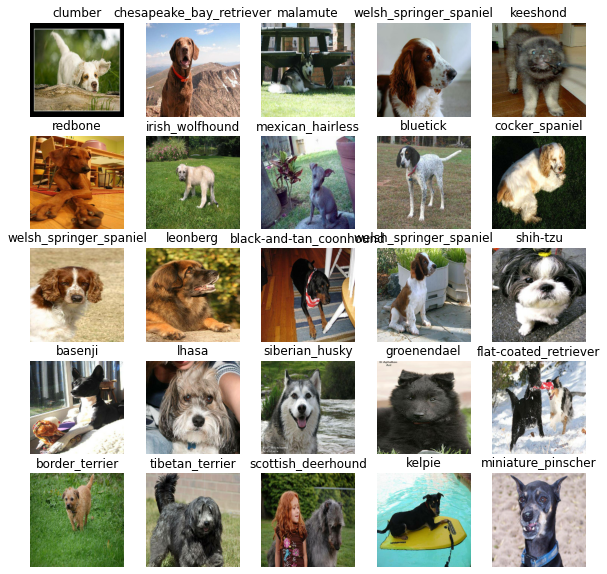

In [45]:
# Now let's visualize the data in a training batch
show_25_images(train_images, train_labels)

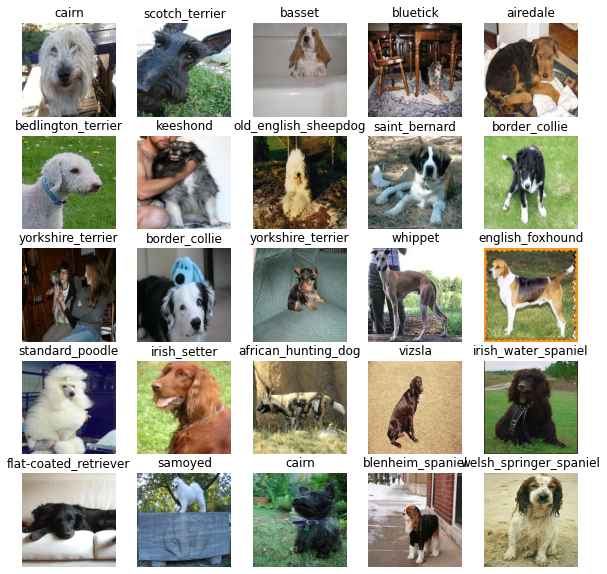

In [46]:
# Now let's visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

Before we build a model, there are a few things we need to define:
* The input shape ( our images shape, in the form of Tensors) to our model. 
* The output shape ( image labels, in the form of Tensors) of our model.
* The URL of the model we want to use from TensorFlow Hub : 
https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [47]:
IMG_SIZE, train_data.element_spec

(224,
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

How machines learn:
https://youtube.com/watch?v=R9OHn5ZF4Uo

What is a neural network:
https://www.youtube.com/watch?v=aircAruvnKk

TensorFlow, Pytorch, ModelZoo, Paperswithcode

In [48]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"


Now we've got our inputs, outputs and model ready to go. Let's put them together into a Keras deep learning model!

Knowing this, I will create a function which:
* Takes the input shape, output shape and the model we've chose as parameters.
* Defines the layers in a Keras model in a sequencial fashion ( do this first, then this, after that, etc)
* Compiles the model ( says it should be evaluated and improved).
* Build the model ( tells the model the input shape it will be getting).
* Returns the model

All these steps can be found also here:
https://www.tensorflow.org/guide/keras/overview

In [49]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with: ", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
                               hub.KerasLayer(MODEL_URL), # Layer 1 ( input layer )
                               tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                                                     activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model



In [50]:
model = create_model()
model.summary()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
keras_layer (KerasLayer)     (None, 1001)              5432713   
_________________________________________________________________
dense (Dense)                (None, 120)               120240    
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


In [51]:
outputs = np.ones(shape=(1, 1, 1280))
outputs

array([[[1., 1., 1., ..., 1., 1., 1.]]])

 ## Creating callbacks

 Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stop improving.

 We will create callbask, one for TensorBoard which helps track our models progress and another foe early stopping which prevents our model training for too long.

 ### TensorBoard Callback

 To setup a TensorBoard callback, we need to do 3 things:
 1. Load the TensorBoard notebook extension
 2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function.
 3. Visualize our models training logs with the `%tensorboard` magic function ( we will do this after model training)

In [52]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [53]:
import datetime

# Create a function to build TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/MyDrive/Dog Vision/logs", 
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  
  return tf.keras.callbacks.TensorBoard(logdir)

### Early stopping callback

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metrics stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping



In [54]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training a model ( on subset of data)

Our first model is only going to train on 1000 images, to make sure that everything is working.

In [55]:
# how many times our model it passes the train data to learn patterns 
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10} 

In [56]:
# Check to make sure that we are still running on a GPU
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

GPU available


Let's create a function which trains a model

* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the training data, validation data, number of epochs to train for (`NUM_EPOCHS`) and the callbacks we'd like to use
* Return the model

In [57]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """

  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to teh data passing it the callbacks we created
  model.fit(x=train_data, 
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  
  # Return the model
  return model

In [58]:
# Fit the model to the data
model = train_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 188s 6s/step - loss: 4.5458 - accuracy: 0.1175 - val_loss: 3.4117 - val_accuracy: 0.2650
Epoch 2/100
25/25 [==============================] - 5s 181ms/step - loss: 1.6343 - accuracy: 0.7025 - val_loss: 2.1263 - val_accuracy: 0.5650
Epoch 3/100
25/25 [==============================] - 4s 162ms/step - loss: 0.5599 - accuracy: 0.9362 - val_loss: 1.6656 - val_accuracy: 0.6300
Epoch 4/100
25/25 [==============================] - 4s 176ms/step - loss: 0.2457 - accuracy: 0.9862 - val_loss: 1.4887 - val_accuracy: 0.6500
Epoch 5/100
25/25 [==============================] - 4s 161ms/step - loss: 0.1456 - accuracy: 0.9950 - val_loss: 1.3994 - val_accuracy: 0.6800
Epoch 6/100
25/25 [==============================] - 4s 178ms/step - loss: 0.0998 - accuracy: 1.0000 - val_loss: 1.3669 - val_accuracy: 0.6700
Epoch 7/100
25/25 [==============================

**Question:** It looks like our model is overfitting because it's performing far better on the training dataset than the validation dataset, what are seom ways to prevent model overfitting in deep learning neural networks?

**Note** Overfitting to begin with is a goo thing! It means our model is learning!

### Checking the TensorBoard logs

The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize it's contents.

In [59]:
%tensorboard --logdir drive/MyDrive/Dog\ Vision/logs

Output hidden; open in https://colab.research.google.com to view.

## Making and evaluating predictions using a trained model

In [60]:
val_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [61]:
# Make predictions on the validation data ( not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 1s 116ms/step


array([[1.1801684e-03, 1.1522863e-04, 2.9363917e-04, ..., 1.2075183e-03,
        3.5028344e-05, 7.1758581e-03],
       [1.1069773e-02, 4.0267652e-04, 1.1192016e-02, ..., 7.9958240e-04,
        6.8228162e-04, 5.7298494e-05],
       [1.5748812e-05, 2.3366231e-04, 6.4240320e-04, ..., 2.2592922e-04,
        3.2196843e-04, 7.6220796e-04],
       ...,
       [2.0044549e-06, 1.9746036e-05, 3.2955693e-06, ..., 2.3408445e-05,
        7.1068476e-05, 4.1521340e-05],
       [4.2390255e-03, 4.6786742e-04, 1.4366288e-04, ..., 2.6955947e-04,
        3.7302962e-05, 8.3100358e-03],
       [1.7844381e-04, 7.1661496e-05, 1.7264946e-03, ..., 3.7441722e-03,
        1.2096396e-03, 3.3402309e-04]], dtype=float32)

In [62]:
predictions.shape

(200, 120)

In [63]:
len(y_val)

200

In [64]:
len(unique_breeds)

120

In [65]:
predictions[0] # highest the value is the predicted image, confidence intervals

array([1.18016836e-03, 1.15228628e-04, 2.93639168e-04, 8.64428643e-04,
       1.44873178e-04, 9.20672828e-05, 7.00364029e-03, 2.00044853e-03,
       2.48751458e-04, 1.33290060e-03, 3.55709053e-04, 6.22531370e-05,
       2.35759435e-04, 2.19639987e-05, 3.30199342e-04, 1.27921056e-03,
       5.62699388e-05, 1.93409607e-01, 3.58678080e-05, 2.38477223e-04,
       1.13073213e-04, 5.31046644e-05, 1.24914150e-04, 1.69049797e-03,
       1.71712003e-04, 6.67949353e-05, 3.34924430e-01, 5.53406317e-05,
       9.18139296e-04, 3.89066554e-04, 2.96655140e-04, 6.32199168e-04,
       1.76116556e-03, 2.80771656e-05, 8.70796430e-05, 1.24601964e-02,
       1.98825583e-05, 1.25381644e-04, 2.73961487e-05, 3.27680609e-04,
       9.13518074e-04, 2.38274188e-05, 1.19852935e-04, 1.78975970e-04,
       3.42460371e-05, 1.00272220e-04, 1.00809311e-05, 1.38449192e-04,
       3.95504700e-04, 3.54071308e-05, 1.39494601e-04, 3.27520174e-05,
       2.13478866e-04, 4.17322299e-04, 1.55329471e-04, 2.60384531e-05,
      

In [66]:
np.sum(predictions[0])

1.0

In [67]:
np.sum(predictions[1])

1.0

In [69]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [71]:
# First prediction
index = 42
print(predictions[0])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[1.18016836e-03 1.15228628e-04 2.93639168e-04 8.64428643e-04
 1.44873178e-04 9.20672828e-05 7.00364029e-03 2.00044853e-03
 2.48751458e-04 1.33290060e-03 3.55709053e-04 6.22531370e-05
 2.35759435e-04 2.19639987e-05 3.30199342e-04 1.27921056e-03
 5.62699388e-05 1.93409607e-01 3.58678080e-05 2.38477223e-04
 1.13073213e-04 5.31046644e-05 1.24914150e-04 1.69049797e-03
 1.71712003e-04 6.67949353e-05 3.34924430e-01 5.53406317e-05
 9.18139296e-04 3.89066554e-04 2.96655140e-04 6.32199168e-04
 1.76116556e-03 2.80771656e-05 8.70796430e-05 1.24601964e-02
 1.98825583e-05 1.25381644e-04 2.73961487e-05 3.27680609e-04
 9.13518074e-04 2.38274188e-05 1.19852935e-04 1.78975970e-04
 3.42460371e-05 1.00272220e-04 1.00809311e-05 1.38449192e-04
 3.95504700e-04 3.54071308e-05 1.39494601e-04 3.27520174e-05
 2.13478866e-04 4.17322299e-04 1.55329471e-04 2.60384531e-05
 1.28047439e-04 7.69242784e-03 1.54467227e-04 4.60664332e-02
 6.37166086e-05 3.23054664e-05 5.24369767e-04 9.03103064e-05
 2.63158960e-04 1.880636

In [72]:
unique_breeds[113]

'walker_hound'

Having the above functionality is great but we want to be able to do it at scale.

And it would be even better if we could see the image the prediction is being made on!

**Note:** Prediction probabilities are also known as confidence levels

In [80]:
# Turn prediction probabilites into their respective label ( easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """

  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[111])
pred_label

'greater_swiss_mountain_dog'

Now since our validation data is still in a batch dataset, we will have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels (truth labels).

In [81]:
val_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [83]:
images_ = [] #unbatched data
labels_ = []

# Loop through unbatched data
for image, label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

In [94]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays of images and labels.
  """

  images = []
  labels = []

  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])

  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [88]:
get_pred_label(val_labels[0])

'cairn'

In [89]:
get_pred_label(predictions[0])

'cairn'

Now we've got ways to get:
* Prediction labels
* Validation labels ( truth labels )
* Validation images

Let's make some function to make these all a bit more visualize

We will create a function which:
* Takea an array of prediction probabilities, an array of truth labels and an array of images an integer.
* Convert the prediction probabilities to a predicted label.
* Plot the predicted label, its'predicted probability, the truth lable and the target image on a single plot

In [108]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image and remove ticks
  plt.imshow(image)
  plt.xticks([]) # turn ticks off
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("predicted {} \n probability {:2.0f}% \n expected {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)


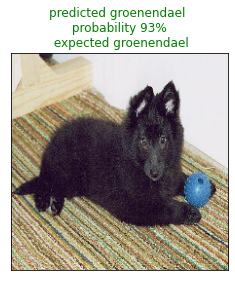

In [109]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images, 
          n=77)

Now we've got one function to visualize our models top prediction, let's make another to view our models top 10 predictions.

This function will:
* Take an input of prediction probabilities array and a ground truth array and an integer
* Find the prediction using `get_pred_label()`
* Find the top 10:
   * Prediction probabilities indexes
   * Prediction probabilities values
   * Prediction labels
* Plot the top 10 prediction probability values and labels, coloring the true label green

In [110]:
predictions[0][predictions[0].argsort()[-10:][::-1]]

array([0.33492443, 0.1934096 , 0.08685521, 0.06511214, 0.04606643,
       0.03932223, 0.03795821, 0.02847159, 0.01880636, 0.01656789],
      dtype=float32)

In [111]:
predictions[0].max()

0.33492443

In [114]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plut the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1] # argsort sort and return the indexes

  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)), 
                               top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")
  
  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass




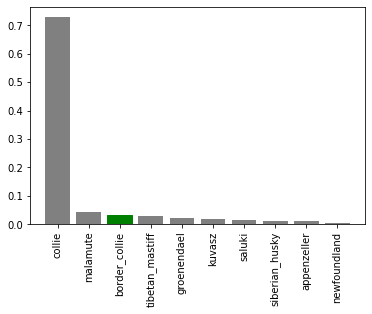

In [115]:
plot_pred_conf(prediction_probabilities=predictions, 
               labels=val_labels,
               n=9)

Now we've got some function to help us visualize our predictions and evaluate our model, let's check out

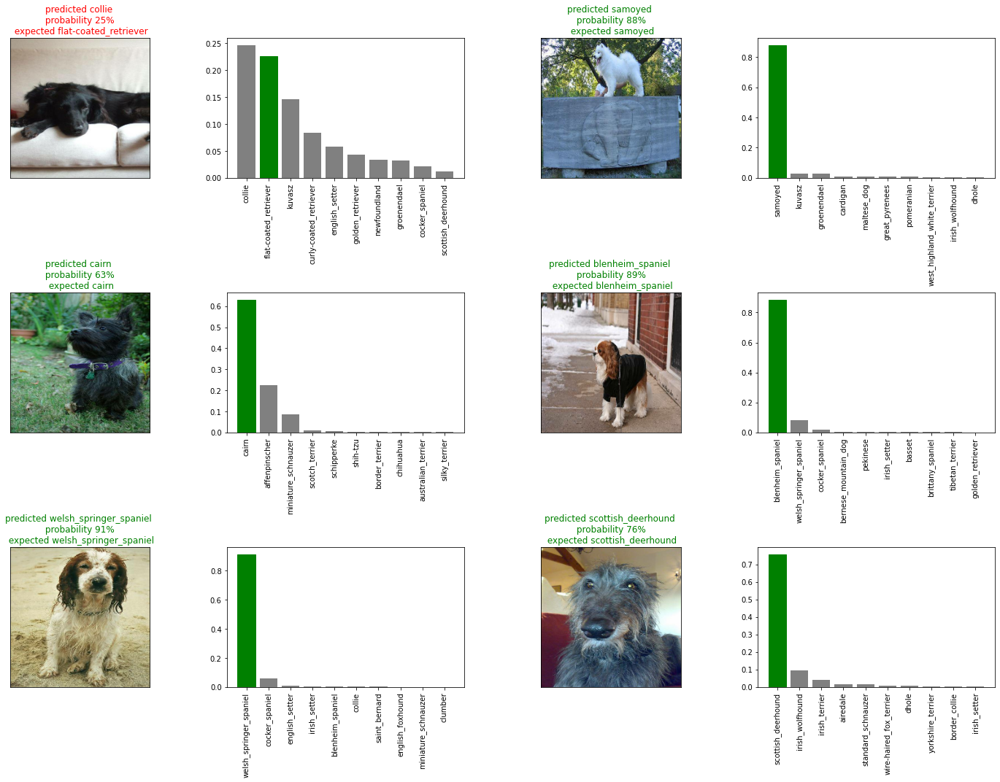

In [119]:
# Let's check out a few prediction and their different values

i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize=(10 * num_cols, 5 * num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2 * num_cols, 2*i + 1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2 * num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()


## Saving and reloading a trained model

In [124]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix ( string ).
  """

  # Create a model directory pathname wit hcurrent time
  modeldir = os.path.join("drive/MyDrive/Dog Vision/models", 
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  
  model_path = modeldir + "-" + suffix + ".h5" # Save format model
  print(f"Svaing model to: {model_path}....")
  model.save(model_path)
  return model_path

In [122]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from our specified path.
  """

  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer": hub.KerasLayer})
  return model

Now we've got functions to save and load a trained model, let's make sure they work!

In [125]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Svaing model to: drive/MyDrive/Dog Vision/models/20210826-09521629971534-1000-images-mobilenetv2-Adam.h5....


'drive/MyDrive/Dog Vision/models/20210826-09521629971534-1000-images-mobilenetv2-Adam.h5'

In [126]:
# Load our model
loaded_1000_image_model = load_model('drive/MyDrive/Dog Vision/models/20210826-09521629971534-1000-images-mobilenetv2-Adam.h5')

Loading saved model from: drive/MyDrive/Dog Vision/models/20210826-09521629971534-1000-images-mobilenetv2-Adam.h5


In [127]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 108ms/step - loss: 1.2702 - accuracy: 0.6900


[1.2701853513717651, 0.6899999976158142]

In [128]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 106ms/step - loss: 1.2702 - accuracy: 0.6900


[1.2701853513717651, 0.6899999976158142]

## Training a big dog model  ( on the full data)





In [130]:
len(X), len(y)

(10222, 10222)

In [131]:
# Create a data batch with the full data set
full_data = create_data_batches(X, y)

Creating training data batches....


In [132]:
full_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [133]:
# Create a model for full data
full_model = create_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [134]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()

# NO validation set whe ntraining on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3) # 3 epochs

**Note** Running the cell below will take a little while
(maybe up to 30 minute for the first epoch) because the GPU we are using in the runtime has to load all of the images into memory.

In [135]:
# Fit the full model to the full data set
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 1522s 5s/step - loss: 1.3429 - accuracy: 0.6658
Epoch 2/100
320/320 [==============================] - 39s 123ms/step - loss: 0.4012 - accuracy: 0.8819
Epoch 3/100
320/320 [==============================] - 38s 119ms/step - loss: 0.2362 - accuracy: 0.9336
Epoch 4/100
320/320 [==============================] - 38s 118ms/step - loss: 0.1533 - accuracy: 0.9661
Epoch 5/100
320/320 [==============================] - 38s 119ms/step - loss: 0.1064 - accuracy: 0.9776
Epoch 6/100
320/320 [==============================] - 38s 119ms/step - loss: 0.0761 - accuracy: 0.9866
Epoch 7/100
320/320 [==============================] - 39s 120ms/step - loss: 0.0582 - accuracy: 0.9915
Epoch 8/100
320/320 [==============================] - 39s 122ms/step - loss: 0.0451 - accuracy: 0.9949
Epoch 9/100
320/320 [==============================] - 39s 121ms/step - loss: 0.0383 - accuracy: 0.9963
Epoch 10/100
320/320 [==============================] - 38s 119ms

In [136]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Svaing model to: drive/MyDrive/Dog Vision/models/20210826-10491629974959-full-image-set-mobilenetv2-Adam.h5....


'drive/MyDrive/Dog Vision/models/20210826-10491629974959-full-image-set-mobilenetv2-Adam.h5'

In [137]:
# Loading the full model
loaded_full_model = load_model("drive/MyDrive/Dog Vision/models/20210826-10491629974959-full-image-set-mobilenetv2-Adam.h5")

Loading saved model from: drive/MyDrive/Dog Vision/models/20210826-10491629974959-full-image-set-mobilenetv2-Adam.h5


## Making predictions on the test dataset

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data we will have to get it into the same format.

Luckily we created `create_data_batches()` earlier which can take a list of filename as input and convert them into Tensor batches.

To make predictions on the test data, we will:
* Get the test image filenames
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True` ( since the test data doesn't have labels).
* Make predictions array by passing the test batches to the `predict()` method called on our model

In [138]:
# Load test image filanames
test_path = "drive/MyDrive/Dog Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog Vision/test/e2f94ad185a2cfa2311c66c3e8bdba17.jpg',
 'drive/MyDrive/Dog Vision/test/ddf0164ab3a269b179051bdecaea34b0.jpg',
 'drive/MyDrive/Dog Vision/test/e265af5e8f446888c6e7ec31f803d63e.jpg',
 'drive/MyDrive/Dog Vision/test/e5e51d0dfc3ccdb74de51933b2671742.jpg',
 'drive/MyDrive/Dog Vision/test/e06fdea86b416e992137ad52bb5da5a8.jpg',
 'drive/MyDrive/Dog Vision/test/def88eeacc633cbc3d46d5f5fb495379.jpg',
 'drive/MyDrive/Dog Vision/test/e73efb021b7b49e328b2159d34060b82.jpg',
 'drive/MyDrive/Dog Vision/test/e24877545b682257ca77ae600df1fe37.jpg',
 'drive/MyDrive/Dog Vision/test/de4223b8c5ca7b80d34d1cd2b5e62351.jpg',
 'drive/MyDrive/Dog Vision/test/e7dc8cc599049ea9fa2a172c88646c57.jpg']

In [139]:
len(test_filenames)

10358

In [140]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches....


In [141]:
test_data

<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

**Note** Calling `predict()` on our full model and passing it the test data batch will take a long time to run. This is because we have to process ~10000+ images and get our model to find patterns in those images and generate predictions based on the training dataset.

In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data, 
                                             verbose=1)

241/324 [=====================>........] - ETA: 9:42

In [ ]:
# Save predictions (NumPy array) to csv file ( for access later)
np.savetxt("drive/MyDrive/Dog Vision/preds_array.csv", test_predictions, delimiter=",")

In [ ]:
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt("drive/MyDrive/Dog Vision/preds_array.csv", delimiter=",")

## Preparing test dataset predictions for Kaggle

Looking at the Kaggle sample submission, we find that it wants our models to prediction probability outputs in a DataFrame with an ID and a column for each different dog breed.

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

To get the data in this format, we will:
* Create a pandas DataFrame with an ID column as well as a column for each dog breed
* Add data to the ID column by extracting the test image ID's from their filepaths
* Add data ( the prediction probabilities) to each of the dog breed columns.
* Export the DataFrame as a CSV to submit it to Kaggle

In [ ]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

In [ ]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splittext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

In [ ]:
# Save our predictions dataframe to csv for submission to Kaggle
preds_df.to_csv("drive/MyDrive/Dog Vision/full_model_predictions_submission_1_mobilenetV2.csv",
                index=False)